# 02: Training

This notebook loads the data from the previous notebook and trains a model to predict forest attributes. The model is evaluated and saved to disk for later use.

In [2]:
import tensorflow as tf
from sklearn.metrics import r2_score
import plotly.express as px
import numpy as np

from naip_cnn.data import TrainingDataset
from naip_cnn.acquisitions import MAL2007, Acquisition
from naip_cnn import models


tf.config.list_physical_devices("GPU")

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

## Load Data

Before training, we need load our dataset, split it into training and validation sets, and divide it into batches. The same `TrainingDataset` class we used to generate the dataset can be re-used now for training. All of the parameters we defined when generating our training dataset are stored in the file name, allowing us to load a complete `TrainingDataset` from the file we exported earlier.

Additional parameters like the NAIP bands to include, the LiDAR attribute to predict, and the model batch size are defined separately.

In [6]:
BANDS = ("R", "G", "B", "N")
LABEL = "cover"
BATCH_SIZE = 64

dataset = TrainingDataset.from_filename("MAL2016_CanyonCreek-1-30-150x150-150")

train = (
    dataset.load_train(label=LABEL, bands=BANDS)
    .cache()
    .shuffle(buffer_size=10_000)
    .batch(BATCH_SIZE, drop_remainder=True)
    .prefetch(tf.data.AUTOTUNE)
)

val = (
    dataset.load_val(label=LABEL, bands=BANDS)
    .cache()
    .batch(BATCH_SIZE, drop_remainder=True)
    .prefetch(tf.data.AUTOTUNE)
)

## Build and Train Model

With the data loaded, we can build a CNN model and train it. The `ModelRun` class wraps a Keras model and a `TrainingDataset` and is used to organize, identify, and export a given model run.

In [7]:
model = models.CNN_v2(
    shape=(*dataset.naip_shape, len(BANDS)), out_shape=dataset.lidar_shape
)
run = models.ModelRun(
    model=model,
    dataset=dataset,
    label=LABEL,
    bands=BANDS,
)

While training the model, we'll use two callbacks: 

- `EarlyStopping` interrupts training if loss stops improving after the number of epochs defined by `patience`. This can reduce training time by aborting once a model starts to overfit, when further epochs are unlikely to improve model performance. Lower `patience` values stop the model sooner, but may trigger prematurely due to random fluctuations in loss.
- `ModelCheckpoint` stores the weights of the best performing epoch, allowing us to restore the optimal model if later epochs begin to overfit. 

*Note that while `EarlyStopping` *can* restore weights, this only works if the callback is triggered, which may not happen if `patience` is not exceeded.*

In [8]:
callbacks = [
    tf.keras.callbacks.EarlyStopping(
        monitor="val_loss", verbose=1, patience=10, restore_best_weights=False
    ),
    tf.keras.callbacks.ModelCheckpoint(
        filepath=run.checkpoint_path,
        save_best_only=True,
        save_weights_only=True,
        verbose=False,
        monitor="val_loss",
    ),
]

run.model.fit(
    train,
    verbose=1,
    validation_data=val,
    epochs=25,
    callbacks=callbacks,
)

Epoch 1/25
232/232 [==============================] - 80s 171ms/step - loss: 318.0555 - val_loss: 178.4640
Epoch 2/25
232/232 [==============================] - 6s 25ms/step - loss: 176.1164 - val_loss: 147.5288
Epoch 3/25
232/232 [==============================] - 6s 25ms/step - loss: 158.2100 - val_loss: 139.8839
Epoch 4/25
232/232 [==============================] - 6s 25ms/step - loss: 151.3651 - val_loss: 135.2078
Epoch 5/25
232/232 [==============================] - 6s 25ms/step - loss: 143.2824 - val_loss: 133.7071
Epoch 6/25
232/232 [==============================] - 6s 25ms/step - loss: 133.4951 - val_loss: 131.4952
Epoch 7/25
232/232 [==============================] - 6s 25ms/step - loss: 127.8576 - val_loss: 124.4220
Epoch 8/25
232/232 [==============================] - 6s 25ms/step - loss: 129.6614 - val_loss: 154.0856
Epoch 9/25
232/232 [==============================] - 6s 25ms/step - loss: 121.1847 - val_loss: 121.9211
Epoch 10/25
232/232 [==============================] 

Once training is complete, we can restore the weights of the best epoch and store the entire model for later use.

In [9]:
run.load_best_weights()
run.save_model()

## Evaluate Model


We can use `evaluate` to get an idea of model performance.

In [10]:
run.model.evaluate(val);

29/29 [==============================] - 1s 11ms/step - loss: 115.8439


### Generate Predictions

For a closer look, we'll predict labels for our validation set that we can compare to the true labels.

In [11]:
y_pred = run.model.predict(val)
y_true = np.concatenate([data[1] for data in val.as_numpy_iterator()])

29/29 [==============================] - 1s 21ms/step


### Assess Correlation

Now we can calculate an R<sup>2</sup> to assess correlation between the predicted and actual values.

In [12]:
r2_score(y_true.ravel(), y_pred.ravel())

0.7656093627228702

A scatter-plot with a 1:1 line will further illustrate correlation.

In [13]:
fig = px.scatter(
    x=y_pred.ravel(),
    y=y_true.ravel(),
    labels={"x": "Predicted", "y": "True"},
    height=600,
    width=600,
    template="plotly_white",
    marginal_x="histogram",
    marginal_y="histogram",
)

# Add 1:1 line
fig.add_shape(
    type="line",
    x0=0,
    y0=0,
    x1=100,
    y1=100,
    line=dict(color="black", width=2, dash="dash"),
)

fig

### Preview Outputs

In [14]:
import matplotlib.pyplot as plt

In [15]:
X_ref = np.concatenate([data[0] for data in val.as_numpy_iterator()])

Text(0.5, 1.0, 'Cancov (pred)')

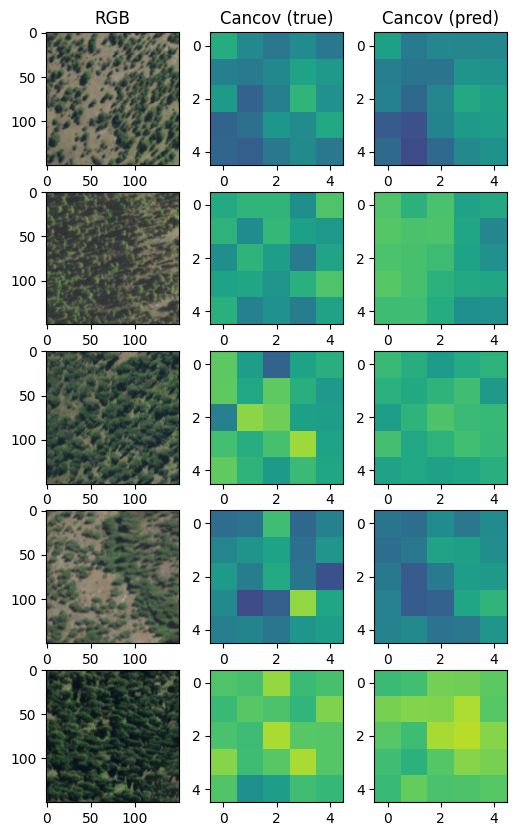

In [16]:
rng = np.random.default_rng(99)
check_samples = rng.choice(range(len(X_ref)), size=5, replace=False)

fig, ax = plt.subplots(len(check_samples), 3, figsize=(6, 2 * len(check_samples)))

for i, sample in enumerate(check_samples):
    ax[i, 0].imshow(X_ref[sample, ..., :3])
    ax[i, 1].imshow(y_true[sample, ...], vmin=0, vmax=100)
    ax[i, 2].imshow(y_pred[sample, ...], vmin=0, vmax=100)

ax[0, 0].set_title("RGB")
ax[0, 1].set_title("Cancov (LiDAR)")
ax[0, 2].set_title("Cancov (pred)")